In [1]:
import ezc3d
import numpy as np
import json
import pandas as pd
import pickle
import os
from io import StringIO

from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px
import plotly.subplots as sp

import ipywidgets as widgets
from ipywidgets import interact,FloatSlider,IntSlider,interactive,HBox
from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual

In [2]:
from c3d_to_trc import read_trc_to_dataframe, read_c3d_to_df, read_sto_and_header_to_json

In [23]:
file_path = 'HSS_DATA/squat1JointAngles.txt'
def read_hss_txt(file_path):
    df_hss = pd.read_csv(file_path, sep='\t', header=[1, 4])
    
    # Managing missing values by filling them with NaNs (default behavior)
    df_hss.replace('', pd.NA, inplace=True)
    
    df_dropped = df_hss.drop(df_hss.columns[0], axis=1)
    
    df_dropped.columns = ['{}_{}'.format(col[0], col[1]) for col in df_dropped.columns]
    
    return df_dropped

In [25]:
angle_pairs_dari = [ 
            ['RHipAngles_X','hip_flexion_r', 1],
            ['RHipAngles_Y','hip_adduction_r', 1],
            ['RHipAngles_Z','hip_rotation_r', 1],
            ['LHipAngles_X','hip_flexion_l', 1],
            ['LHipAngles_Y','hip_rotation_l', 0],
            ['LHipAngles_Z','hip_adduction_l', 1],
            ['RKneeAngles_X','knee_angle_r', 1],
            ['LKneeAngles_X','knee_angle_l', 1],
            ['RAnkleAngles_X','ankle_angle_r', 1],
            ['LAnkleAngles_X','ankle_angle_l', 1],
            ]

file_pairs = [['IK_Dari_squat_subj1.sto', 'DARI_DATA/Captury_Subj1_squat02.c3d'],
             ['IK_Dari_squat_subj2.sto','DARI_DATA/Captury_Subj2_bilateral_squat03.c3d'],
             ['IK_Dari_squat_subj3.sto','DARI_DATA/Captury_Subj3_bilateral_squat02.c3d'],
             ['IK_Dari_squat_subj4.sto','DARI_DATA/Captury_Subj4_bilateral_squat01.c3d'],
             ['IK_Dari_squat_subj8.sto','DARI_DATA/Captury_Subj8_bilateral_squat02.c3d']]

In [26]:
angle_ch= angle_pairs_dari[1]

def plot_and_save(angle_ch, type = 'DARI'):
    fig2 = sp.make_subplots(rows=1, cols=5)
    
    ch_n = 1
    for i in file_pairs:
    #        print(ch_n, row_n)
    
        df_system = read_c3d_to_df(i[1])
    
        df_sto, header_json_str = read_sto_and_header_to_json(i[0])
    
        fig2.add_trace(go.Scatter(x = df_system['Time'], y = df_system[angle_ch[0]] , mode='lines', name=f'Dari, {angle_ch[0]}'), row=1, col=ch_n)
        
        y_osim = df_sto[angle_ch[1]]
    
        if angle_ch[2]:
            y = y_osim * -1.0
        else:
            y = y_osim 
        
        fig2.add_trace(go.Scatter(x = df_sto['time'], y = y, mode='lines', name=f'OpenSim_Dari, {angle_ch[1]}'), row=1, col=ch_n)
        
    #    fig2.add_trace(go.Scatter(x = df_sto_hss.index, y = df_sto_hss[ch[2]], mode='lines', name=f'OpenSim_HSS, {ch[2]}'), row=1, col=ch_n)
        
        
        fig2.update_yaxes(title_text='Angle, Deg.', row=1, col=ch_n)
        
        fig2.update_xaxes(title_text='Time, sec.', row=1, col=ch_n)
    
        ch_n = ch_n+1
        
    fig2.update_layout(
        autosize=False,
        width=1300,
        height=500,
    )
    
    fig2.show()

#######################################################################################################

def plot_and_save_hss(angle_ch, file_hss_pairs):
    col_n = 1
    fig2 = sp.make_subplots(rows=1, cols=5)
    for file_path in file_hss_pairs:

        df_hss_system = read_hss_txt(file_path[1])
        
        df_hss_sto, header_json_str = read_sto_and_header_to_json(file_path[0])
        
        
        
        fig2.add_trace(go.Scatter(x = df_hss_sto['time'], y = df_hss_system[angle_ch[0]] , mode='lines', name=f'HSS system, ch: {angle_ch[0]} '), row=1, col=col_n)
        
        y = df_hss_sto[angle_ch[1]]
        if angle_ch[2]:
            y = y * -1.0
        
        fig2.add_trace(go.Scatter(x = df_hss_sto['time'], y = y , mode='lines', name=f'HSS OpenSim, ch: {angle_ch[1]} '), row=1, col=col_n)
        
        fig2.update_yaxes(title_text='Angle, Deg.', row=1, col=col_n)
        
        fig2.update_xaxes(title_text='Time, sec.', row=1, col=col_n)
    
        col_n = col_n+1
    
    fig2.update_layout(
                        autosize=False,
                        width=1500,
                        height=500,
                        )
    
    fig2.show()

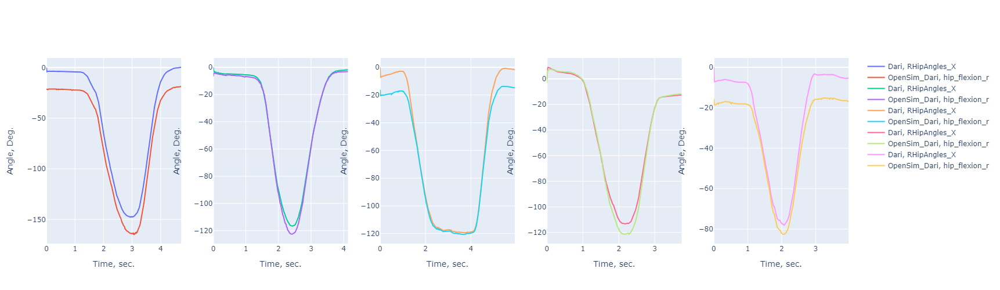

In [27]:
plot_and_save(angle_pairs_dari[0])

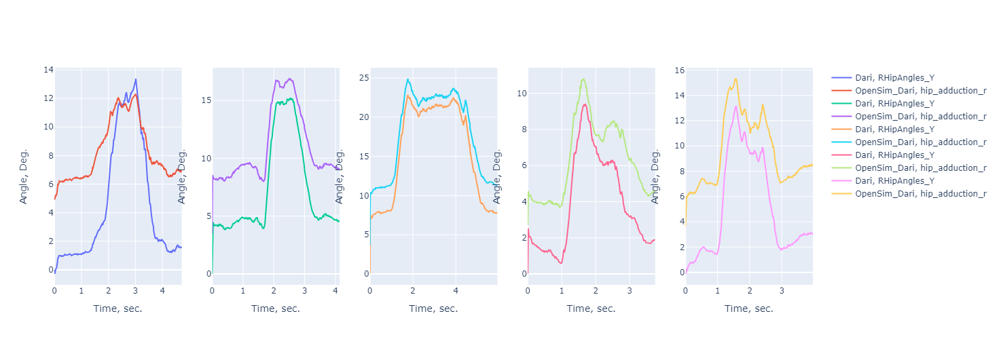

In [6]:
plot_and_save(angle_pairs_dari[1])

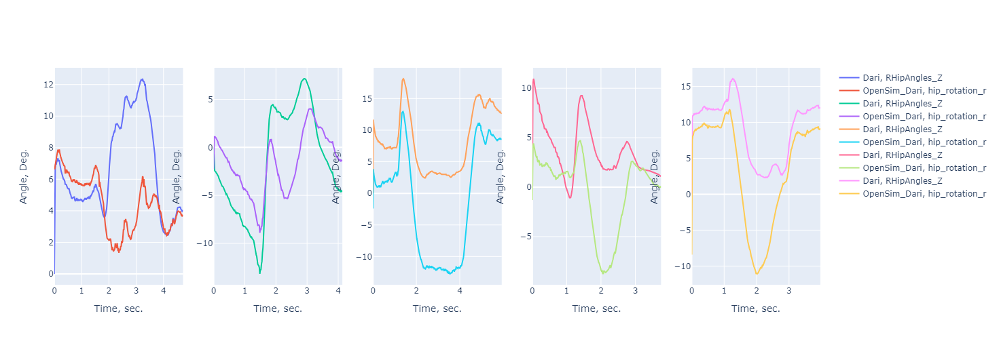

In [7]:
plot_and_save(angle_pairs_dari[2])

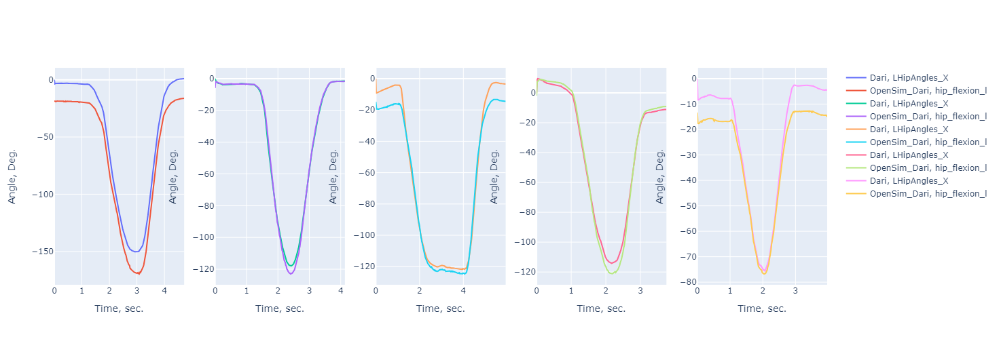

In [8]:
plot_and_save(angle_pairs_dari[3])

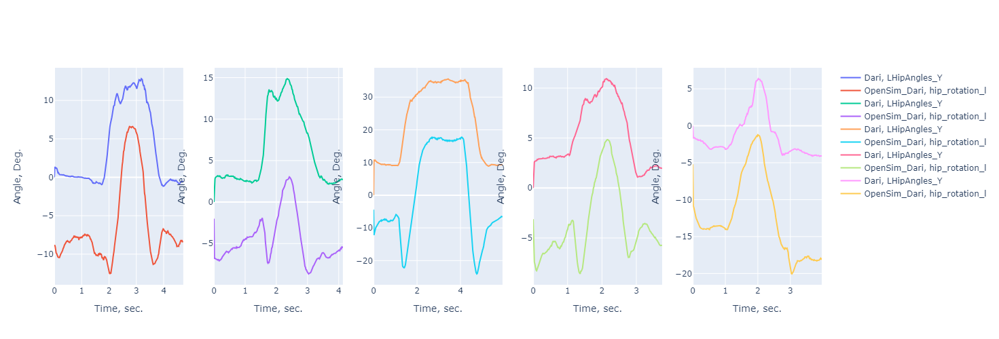

In [9]:
plot_and_save(angle_pairs_dari[4])

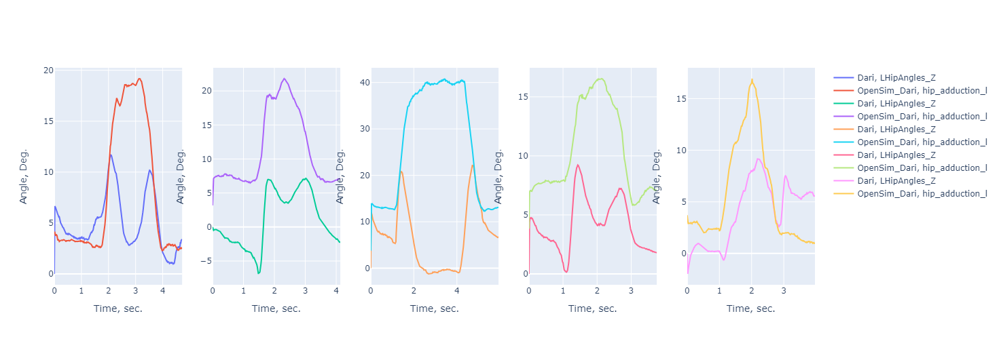

In [10]:
plot_and_save(angle_pairs_dari[5])

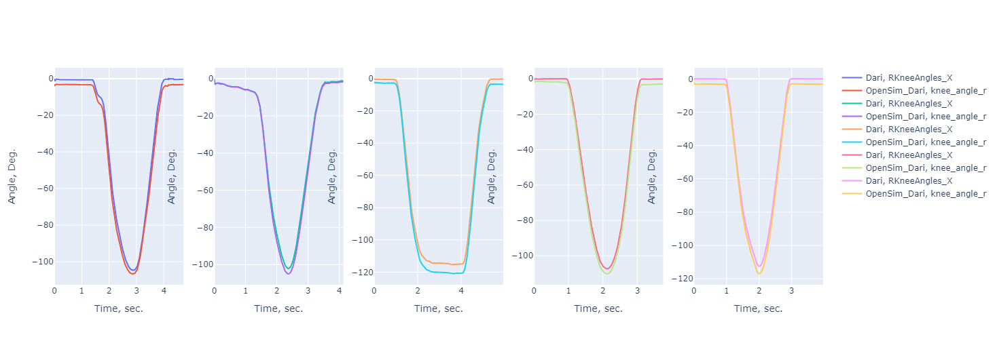

In [11]:
plot_and_save(angle_pairs_dari[6])

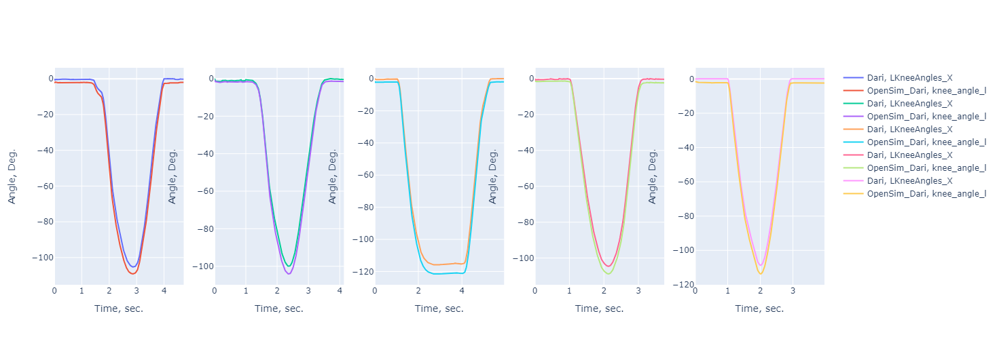

In [12]:
plot_and_save(angle_pairs_dari[7])

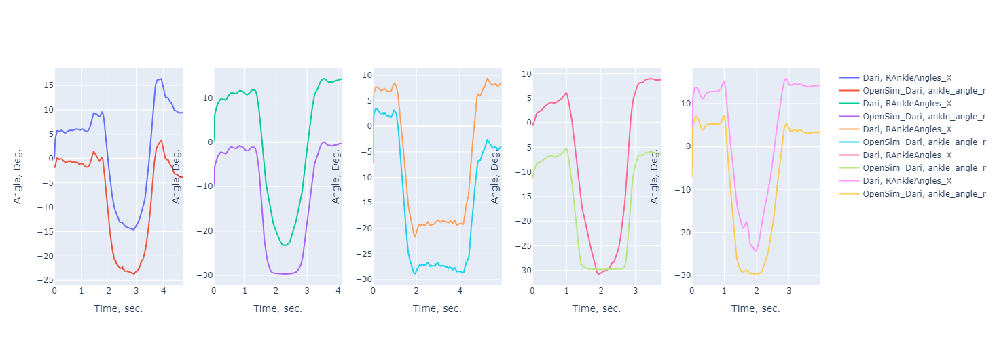

In [13]:
plot_and_save(angle_pairs_dari[8])

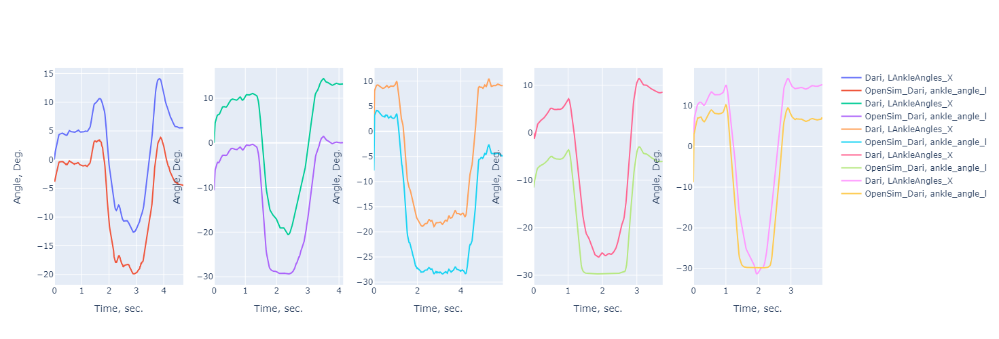

In [14]:
plot_and_save(angle_pairs_dari[9])

In [98]:
angle_pairs_hss = [ 
            ['R_Hip_Angle_X','hip_flexion_r', 0],
            ['R_Hip_Angle_Y','hip_adduction_r', 1],
            ['R_Hip_Angle_Z','hip_rotation_r', 0],
            ['L_Hip_Angle_X','hip_flexion_l', 0],
            ['L_Hip_Angle_Y','hip_rotation_l', 0],
            ['L_Hip_Angle_Z','hip_adduction_l', 0],
            ['R_Knee_Angle_X','knee_angle_r', 1],
            ['L_Knee_Angle_X','knee_angle_l', 1],
            ]

file_hss_pairs = [['IK_HSS_squat1.sto', 'HSS_DATA/squat1JointAngles.txt'],
             ['IK_HSS_squat2.sto','HSS_DATA/squat2JointAngles.txt'],
             ['IK_HSS_squat3.sto','HSS_DATA/squat3JointAngles.txt'],
             ['IK_HSS_squat4.sto','HSS_DATA/squat4JointAngles.txt'],
             ['IK_HSS_squat5.sto','HSS_DATA/squat5JointAngles.txt']]

file_hss_walk_pairs = [['IK_HSS_walk1.sto', 'HSS_DATA/walk1JointAngles.txt'],
             ['IK_HSS_walk2.sto','HSS_DATA/walk2JointAngles.txt'],
             ['IK_HSS_walk3.sto','HSS_DATA/walk3JointAngles.txt'],
             ['IK_HSS_walk4.sto','HSS_DATA/walk4JointAngles.txt'],
             ['IK_HSS_walk5.sto','HSS_DATA/walk5JointAngles.txt']]

In [118]:
file_path = file_hss_pairs[0]

angle_ch= angle_pairs_hss[6]



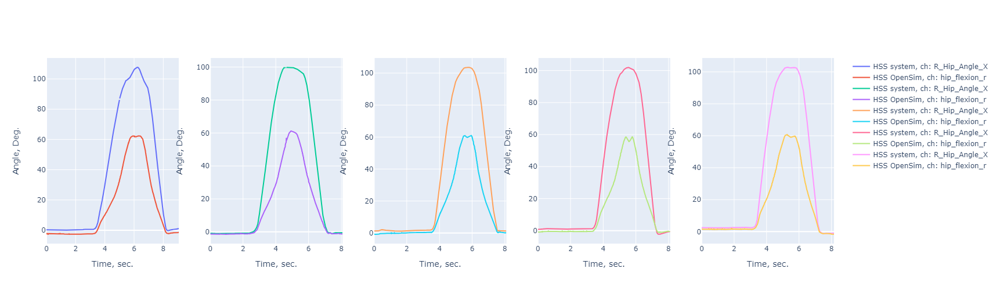

In [119]:
plot_and_save_hss(angle_pairs_hss[0], file_hss_pairs)

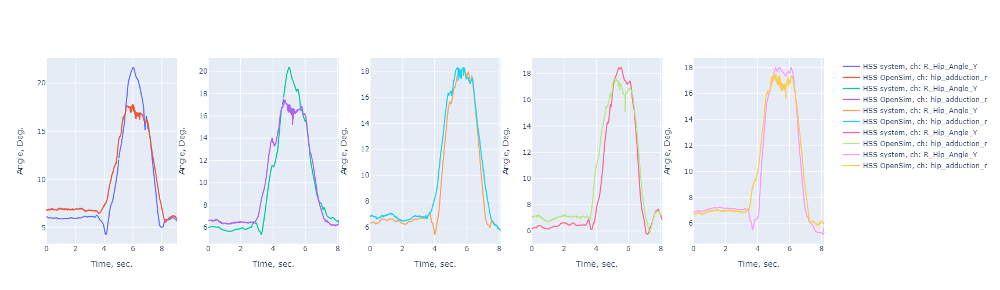

In [128]:
plot_and_save_hss(angle_pairs_hss[1], file_hss_pairs)

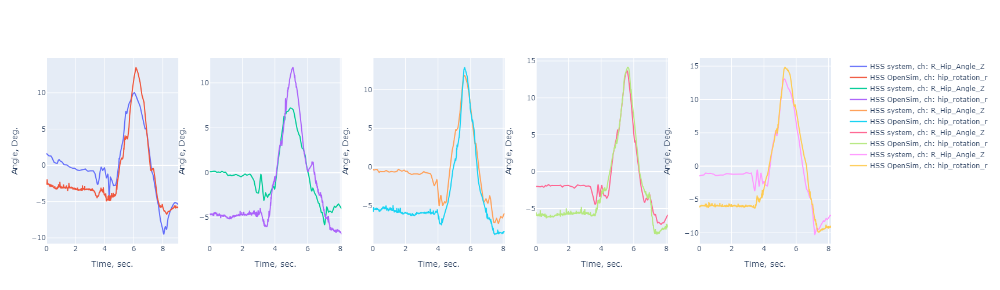

In [129]:
plot_and_save_hss(angle_pairs_hss[2], file_hss_pairs)

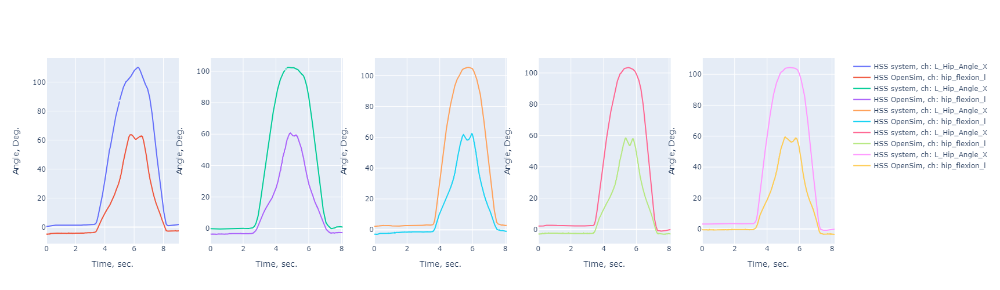

In [130]:
plot_and_save_hss(angle_pairs_hss[3], file_hss_pairs)

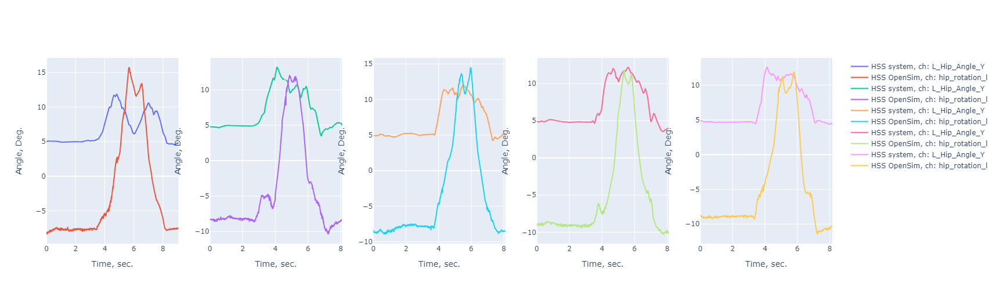

In [131]:
plot_and_save_hss(angle_pairs_hss[4], file_hss_pairs)

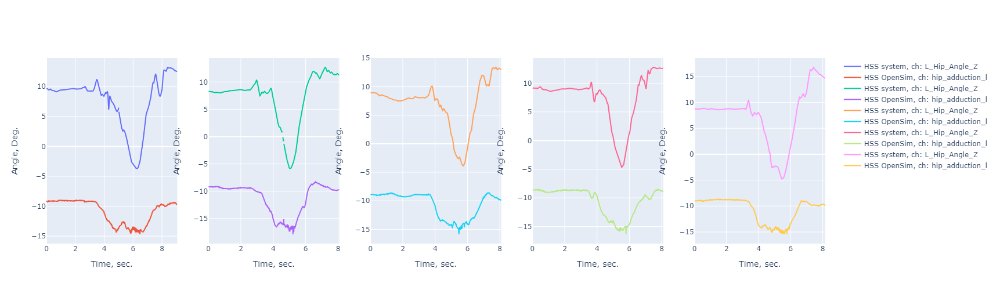

In [132]:
plot_and_save_hss(angle_pairs_hss[5], file_hss_pairs)

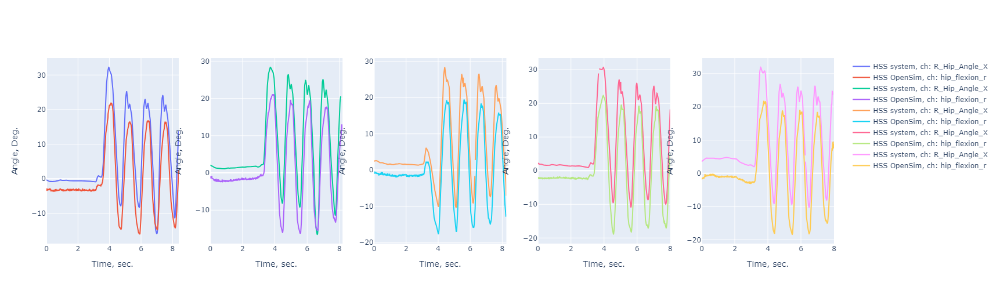

In [120]:
plot_and_save_hss(angle_pairs_hss[0], file_hss_walk_pairs)

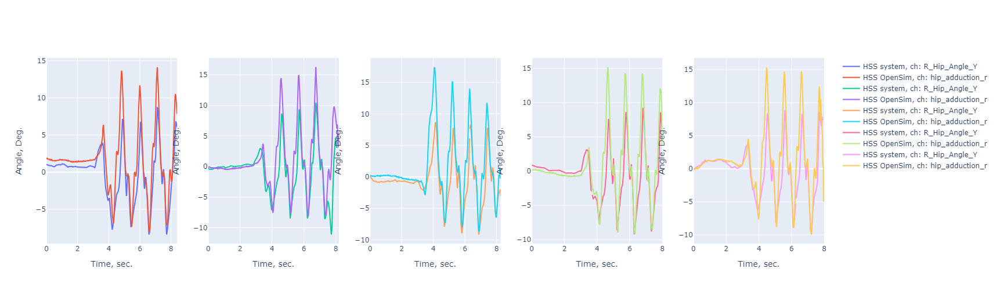

In [121]:
plot_and_save_hss(angle_pairs_hss[1], file_hss_walk_pairs)

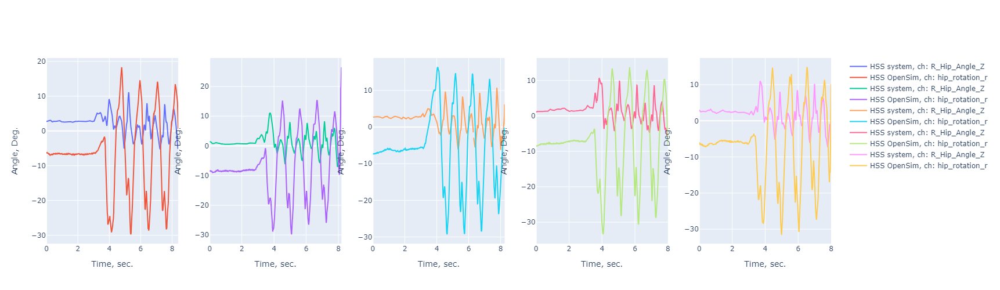

In [122]:
plot_and_save_hss(angle_pairs_hss[2], file_hss_walk_pairs)

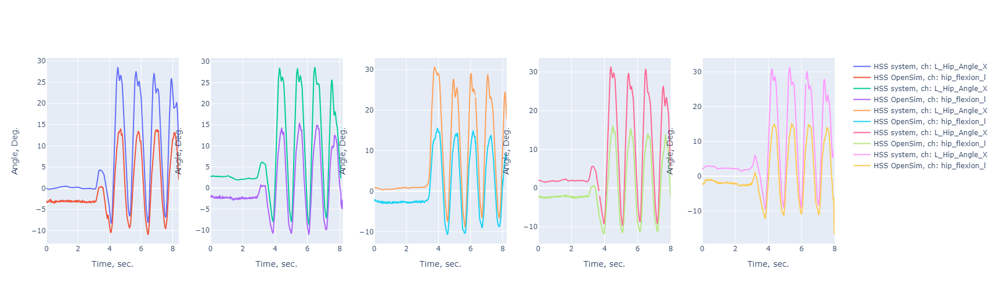

In [123]:
plot_and_save_hss(angle_pairs_hss[3], file_hss_walk_pairs)

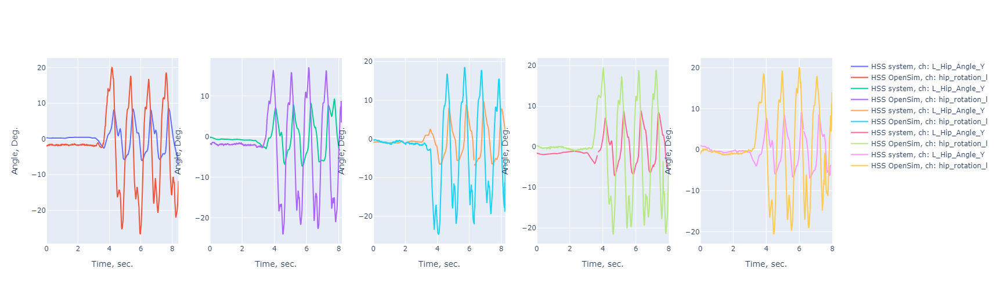

In [124]:
plot_and_save_hss(angle_pairs_hss[4], file_hss_walk_pairs)

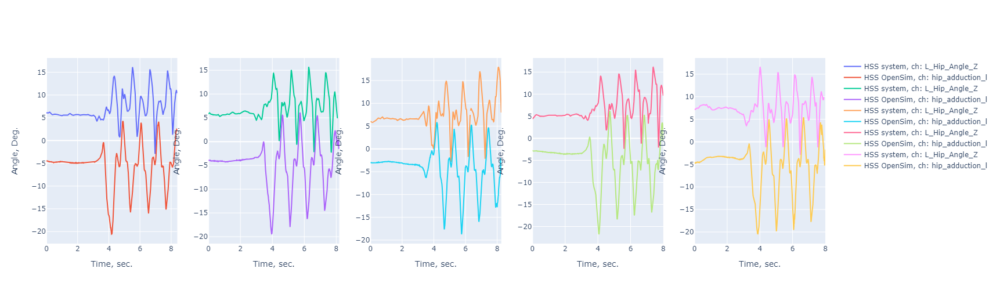

In [125]:
plot_and_save_hss(angle_pairs_hss[5], file_hss_walk_pairs)

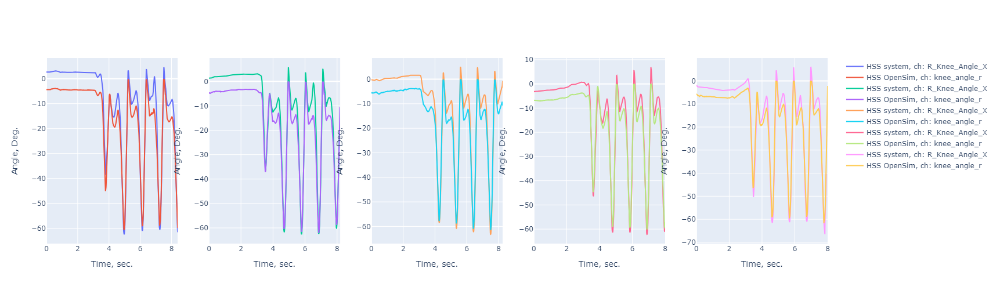

In [126]:
plot_and_save_hss(angle_pairs_hss[6], file_hss_walk_pairs)

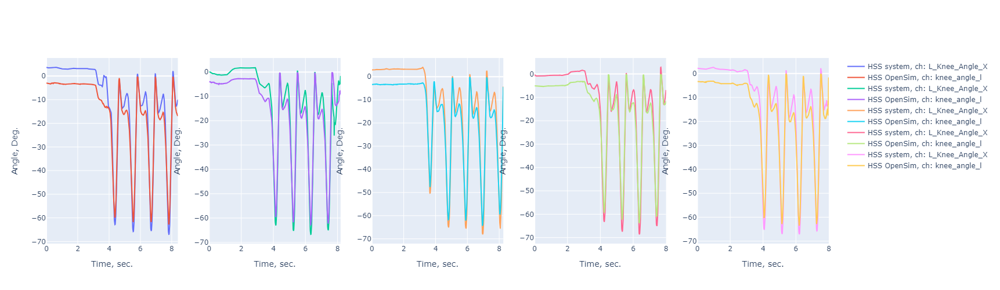

In [127]:
plot_and_save_hss(angle_pairs_hss[7], file_hss_walk_pairs)

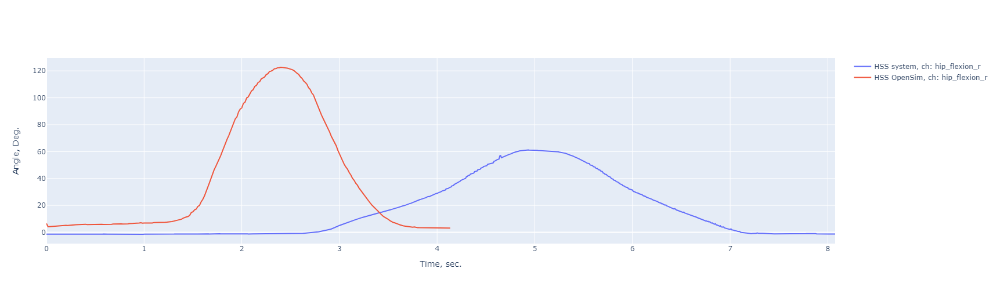

In [144]:
angle_ch =angle_pairs_dari[0]

file_path = [file_pairs[1][0], file_hss_pairs[1][0]]

fig2 = sp.make_subplots(rows=1, cols=1)

df_dari_sto, header_json_str = read_sto_and_header_to_json(file_path[0])

df_hss_sto, header_json_str = read_sto_and_header_to_json(file_path[1])



fig2.add_trace(go.Scatter(x = df_hss_sto['time'], y = df_hss_sto[angle_ch[1]] , mode='lines', name=f'HSS system, ch: {angle_ch[1]} '), row=1, col=1)


fig2.add_trace(go.Scatter(x = df_dari_sto['time'], y = df_dari_sto[angle_ch[1]] , mode='lines', name=f'HSS OpenSim, ch: {angle_ch[1]} '), row=1, col=1)

fig2.update_yaxes(title_text='Angle, Deg.', row=1, col=1)

fig2.update_xaxes(title_text='Time, sec.', row=1, col=1)


fig2.update_layout(
                    autosize=False,
                    width=800,
                    height=500,
                    )

fig2.show()

In [143]:
angle_ch =angle_pairs_dari[0]

['R_Knee_Angle_X', 'knee_angle_r', 1]